# Course Project Part 1
## Data acquisition

The common analysis research question is based on one specific dataset. You should get the Combined wildland fire datasets for the United States and certain territories, 1800s-Present (combined wildland fire polygons) dataset. This dataset was collected and aggregated by the US Geological Survey. The dataset is relatively well documented. The dataset provides fire polygons in ArcGIS and GeoJSON formats. 

### Assigned City: Fresno, California
- 2023 Estimated Population: 545,716
- 2020 density: 4,706 per square mile
- Location: 36.78°N 119.79°W


# Install and Load Python libraries

The following code block references Dr. David W. Mcdonald's example code, adding to the base amount of python libraries called.

In [70]:
%pip install pyproj
%pip install geojson
%pip install requests
%pip install matplotlib
%pip install scipy
%pip install statsmodels
%matplotlib inline


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Note

In [71]:
import json
from pyproj import Transformer, Geod
import re
import os
import geojson
from datetime import datetime
import time
import requests
from collections import defaultdict
from pyproj import Geod
import pandas as pd
from scipy.stats import pearsonr, kendalltau
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import StrMethodFormatter
from collections import defaultdict
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from wildfire.Reader import Reader as WFReader


In [72]:
%env PYTHONPATH=/Users/sarahkilpatrick/Documents/Part 1 - Common Analysis

env: PYTHONPATH=/Users/sarahkilpatrick/Documents/Part 1 - Common Analysis


# Initialize Constants

The following code block references Dr. David W. Mcdonald's example code.

In [73]:
#
#    CONSTANTS
#

#
#    The 'Wildfire_short_sample_2024.json' is an extraction from the full 'USGS_Wildland_Fire_Combined_Dataset.json'
#    dataset extracting several major wildfires in California, plus a couple others that have interested data structure
#    features. 
#
#    The sample file includes data for 15 fires, mostly oriented around the uniqueness of the name. Naming conventions
#    for wildfires is really adhoc, which makes finding any named fire in the dataset a disambiguation mess. The named
#    fires were selected from https://en.wikipedia.org/wiki/List_of_California_wildfires
#
#    The point nof the sample is to provide something small to test with before committing to processing the, much 
#    larger, full dataset.
#
EXTRACT_FILENAME = "USGS_Wildland_Fire_Combined_Dataset.json"
#
#    The user module 'wildfire' contains a Reader object and the sample data. This bit of code finds where that is
#    located on your machine and constructs a path so that the sample data can be loaded. This assumes you have set 
#    a PYTHONPATH environment variable to point to the location on your machine where you store python user modules.
#
#    NOTE: if you use Anaconda for virtual python environments, Anaconda will adhere to the PYTHONPATH conventions
#    for user modules.
#
MODULENAME = "wildfire"
MODULEPATH = ""
try:
    ppath = os.environ.get('PYTHONPATH')
    if not ppath: raise
    MODULEPATH = os.path.join(ppath,MODULENAME)
except:
    # Likely here because a PYTHONPATH was not set, show a warning message
    print("Looks like you're not using a 'PYTHONPATH' to specify the location of your python user modules.")
    print("You may have to modify the sample code in this notebook to get the documented behaviors.")
    MODULEPATH = ""

if MODULEPATH:
    SAMPLE_DATA_FILENAME = os.path.join(MODULEPATH,EXTRACT_FILENAME)
else:
    SAMPLE_DATA_FILENAME = EXTRACT_FILENAME
#
# print out where we think we're going to find the sample data
print(f"{SAMPLE_DATA_FILENAME=}")

#
#    A dictionary of some city locations from the US west coast states.
#
CITY_LOCATIONS = {'fresno' :{'city'   : 'fresno','latlon' : [36.7477 -119.7723] }}

# actual coordinates, not truncated: [36.74773 -119.77237]



SAMPLE_DATA_FILENAME='/Users/sarahkilpatrick/Documents/Part 1 - Common Analysis/wildfire/USGS_Wildland_Fire_Combined_Dataset.json'


# Load Data 

USGS_Wildland_Fire_Combined_Dataset.json is found in the [USGS ScienceBase Catalog](https://www.sciencebase.gov/catalog/item/61aa537dd34eb622f699df81), under GeoJSON Files.zip (first file).

The following code block references Dr. David W. Mcdonald's example code for the Wildfire Reader.

In [74]:
filename = "/Users/sarahkilpatrick/Documents/Part 1 - Common Analysis/USGS_Wildland_Fire_Combined_Dataset.json"
reader = WFReader()

try:
    print(f"attempting to open '{filename}'")
    reader.open(filename)
    print(f"File '{filename}' opened successfully")
except Exception as e:
    print(f"Failed to open file: {str(e)}")
    raise

batch_size = 150
batch = []
count = 0

while True:
    try:
        feature = reader.next()
        if feature:
            batch.append(feature)
            count += 1

            if len(batch) >= batch_size:
                print(f"processing batch of {len(batch)} features...")

        else:
            break

    except Exception as e:
        print(f"Error reading feature {str(e)}")
        break
if len(batch) > 0:
    print(f"processing final batch of {len(batch)} features...")

reader.close()

print(f"Finishing reading {count} features from the file")


attempting to open '/Users/sarahkilpatrick/Documents/Part 1 - Common Analysis/USGS_Wildland_Fire_Combined_Dataset.json'
File '/Users/sarahkilpatrick/Documents/Part 1 - Common Analysis/USGS_Wildland_Fire_Combined_Dataset.json' opened successfully
processing batch of 150 features...
processing batch of 151 features...
processing batch of 152 features...
processing batch of 153 features...
processing batch of 154 features...
processing batch of 155 features...
processing batch of 156 features...
processing batch of 157 features...
processing batch of 158 features...
processing batch of 159 features...
processing batch of 160 features...
processing batch of 161 features...
processing batch of 162 features...
processing batch of 163 features...
processing batch of 164 features...
processing batch of 165 features...
processing batch of 166 features...
processing batch of 167 features...
processing batch of 168 features...
processing batch of 169 features...
processing batch of 170 features..

## Check First Instance for Feature Schema of Raw Data

In [75]:
batch[0]

{'attributes': {'OBJECTID': 1,
  'USGS_Assigned_ID': 1,
  'Assigned_Fire_Type': 'Wildfire',
  'Fire_Year': 1860,
  'Fire_Polygon_Tier': 1,
  'Fire_Attribute_Tiers': '1 (1)',
  'GIS_Acres': 3940.20708940724,
  'GIS_Hectares': 1594.5452365353703,
  'Source_Datasets': 'Comb_National_NIFC_Interagency_Fire_Perimeter_History (1)',
  'Listed_Fire_Types': 'Wildfire (1)',
  'Listed_Fire_Names': 'Big Quilcene River (1)',
  'Listed_Fire_Codes': 'No code provided (1)',
  'Listed_Fire_IDs': '',
  'Listed_Fire_IRWIN_IDs': '',
  'Listed_Fire_Dates': 'Listed Other Fire Date(s): 2006-11-02 - NIFC DATE_CUR field (1)',
  'Listed_Fire_Causes': '',
  'Listed_Fire_Cause_Class': 'Undetermined (1)',
  'Listed_Rx_Reported_Acres': None,
  'Listed_Map_Digitize_Methods': 'Other (1)',
  'Listed_Notes': '',
  'Processing_Notes': '',
  'Wildfire_Notice': 'Wildfire mapping prior to 1984 was inconsistent, infrequent, and done without the aid of more modern fire mapping methods (GPS and satellite imagery). Areas burned

# Filtering data:

- The estimate only considers the last 60 years of wildland fire data (1961-2021).
- The estimate only considers fires that are within 650 miles of your assigned city.
- Defines the annual fire season as running from May 1st through October 31st.


## Initialize Functions for Filtering 

### Convert points between geodetic coordinate systems

One of the constraints in doing geodetic computations is that most of the time we need to have our points (the coordinates for places) in the same geographic coordinate system. There are tons and tons of coordinate systems. You can find descriptions of many of them at [EPSG.io](https://epsg.io).

Looking at the wildfire header information, you can find this in the output of Example 1 (above), we can see fields named "geometryType" and "spatialReference". This looks like:

        "geometryType": "esriGeometryPolygon",
        "spatialReference": {
            "wkid": 102008,
            "latestWkid": 102008
        },

This indicates that the geometry of our wildfire data are generic polygons and that they are expressed in a coordinate system with the well-known ID (WKID) 102008. This coordinate system is also known as [ESRI:102008](https://epsg.io/102008)

If you look back at Example 2 (above), you might have wondered about the line of code that says:

    geocalc = Geod(ellps='WGS84')         # Use WGS84 ellipsoid representation of the earth

That string, 'WGS84', is a representation of the earth, that also relies on a well known coordinate system that is sometimes called 'decimal degrees' (DD). That decimal degrees system has an official name (or WKID) of [EPSG:4326](https://epsg.io/4326).

For the example below, what we're going to do is take the geometry of a fire feature, extract the largest ring (i.e., the largest boundary of the fire) and convert all of the points in that ring from the ESRI:102008 coordinate system to EPSG:4326 coordinates.

Why? You might ask. Well, it turns out that the easy way to get locations for a city is to make a Google query for the location. That will respond with a decimal degress version of latitued and longitude. So, this allows us to move everything into decimal degress before we perform a distance calcluation.

### Compute distance between a place and a wildfire

The basic problem is knowing how far away a fire is from some location (like a city). One issue is that fires are irregularly shaped so the actual answer to that is a bit dependent upon the exact shape and how you want to think about the notion of 'distance'. For example, should we just find the closest point on the perimiter of a fire and call that the distance? Maybe we should find the centroid of the region, identify that as a geolocation (coordinate) and then calculate the distance to that? We can come up with numerous other ways.

The first bit of code finds the point on the perimiter with the shortest distance to the city (place) and returns the distance as well as the lat,lon of the perimeter point.

The second bit of code calculates the average distance of all perimeter points to the city (place) and returns that average as the distance. This is not quite what the centroid would be, but it is probably fairly close.

These are two reasonable ways to think about possible distance to a fire. But both require computing distance to a whole set of points on the perimeter of a fire.

The following code block references Dr. David W. Mcdonald's example code.


In [76]:
# FROM EXAMPLE 4
#    Transform feature geometry data
#
#    The function takes one parameter, a list of ESRI:102008 coordinates that will be transformed to EPSG:4326
#    The function returns a list of coordinates in EPSG:4326
def convert_ring_to_epsg4326(ring_data=None):
    converted_ring = list()
    #
    # We use a pyproj transformer that converts from ESRI:102008 to EPSG:4326 to transform the list of coordinates
    to_epsg4326 = Transformer.from_crs("ESRI:102008","EPSG:4326")
    # We'll run through the list transforming each ESRI:102008 x,y coordinate into a decimal degree lat,lon
    for coord in ring_data:
        lat,lon = to_epsg4326.transform(coord[0],coord[1])
        new_coord = lat,lon
        converted_ring.append(new_coord)
    return converted_ring

# FROM EXAMPLE 5
#    The function takes two parameters
#        A place - which is coordinate point (list or tuple with two items, (lat,lon) in decimal degrees EPSG:4326
#        Ring_data - a list of decimal degree coordinates for the fire boundary
#
#    The function returns a list containing the shortest distance to the perimeter and the point where that is
#
def shortest_distance_from_place_to_fire_perimeter(place=None, ring_data=None):
    # Convert the ring data to the right coordinate system
    ring = convert_ring_to_epsg4326(ring_data)    
    # Create an EPSG:4326 compliant object (WGS84 ellipsoid)
    geodcalc = Geod(ellps='WGS84')
    closest_point = list()

    # Run through each point in the converted ring data
    for point in ring:
        try:
            # Calculate the distance
            d = geodcalc.inv(place[1], place[0], point[1], point[0])
            # Convert the distance to miles
            distance_in_miles = d[2] * 0.00062137
            # If it's closer to the city than the current closest point, update it
            if not closest_point:
                closest_point = [distance_in_miles, point]
            elif closest_point[0] > distance_in_miles:
                closest_point = [distance_in_miles, point]
        except IndexError:
            # Skip points with an indexing error
            continue

    return closest_point

#distance_info = shortest_distance_from_place_to_fire_perimeter([36.7477 -119.7723], ring_data)
#    
#    The function takes two parameters
#        A place - which is coordinate point (list or tuple with two items, (lat,lon) in decimal degrees EPSG:4326
#        Ring_data - a list of decimal degree coordinates for the fire boundary
#
#    The function returns the average miles from boundary to the place
#
def average_distance_from_place_to_fire_perimeter(place=None,ring_data=None):
    # convert the ring data to the right coordinate system
    ring = convert_ring_to_epsg4326(ring_data)    
    # create a epsg4326 compliant object - which is what the WGS84 ellipsoid is
    geodcalc = Geod(ellps='WGS84')
    # create a list to st
    # ore our results
    distances_in_meters = list()
    # run through each point in the converted ring data
    for point in ring:
        # calculate the distance
        d = geodcalc.inv(place[1],place[0],point[1],point[0])
        distances_in_meters.append(d[2])
    #print("Got the following list:",distances_in_meters)
    # convert meters to miles
    distances_in_miles = [meters*0.00062137 for meters in distances_in_meters]
    # the esri polygon shape (the ring) requires that the first and last coordinates be identical to 'close the region
    # we remove one of them so that we don't bias our average by having two of the same point
    distances_in_miles_no_dup = distances_in_miles[1:]
    # now, average miles
    average = sum(distances_in_miles_no_dup)/len(distances_in_miles_no_dup)
    return average



## Test Shortest-Distance Calculation

This block of code tests the first attribute (the first wildfire) and finds it to be over 700 miles away.

In [77]:
# Sample data for testing
tester = batch[0]
#distance_info = shortest_distance_from_place_to_fire_perimeter([36.7477 -119.7723], ring_data)
# Define Fresno using CITY_LOCATIONS
CITY_LOCATIONS = {'fresno': {'city': 'fresno', 'latlon': [36.7477, -119.7723]}}
place = CITY_LOCATIONS['fresno']['latlon']  # Fresno coordinates

# Extract the ring data from the sample batch
ring_data = tester['geometry']['rings'][0]

# Test the shortest_distance_from_place_to_fire_perimeter function
closest_point = shortest_distance_from_place_to_fire_perimeter(place=place, ring_data=ring_data)

# Output the result
print("Closest Distance (miles):", closest_point[0])
print("Closest Point (lat, lon):", closest_point[1])


Closest Distance (miles): 781.7254464986428
Closest Point (lat, lon): (47.8133093588732, -123.04117444728125)


## Calculate All Shortest-Distances

All fires are given two new features, 'Closest_Distance_Miles' and'Closest_Point', and then are saved to an intermediary JSON file named processed_fire_data.json.

Attributes with missing data that would cause the distance calculator function to fail are expected to trip a key error, handled by a try/except.

In [78]:
# Define Fresno using CITY_LOCATIONS
CITY_LOCATIONS = {'fresno': {'city': 'fresno', 'latlon': [36.7477, -119.7723]}}
place = CITY_LOCATIONS['fresno']['latlon']  # Fresno coordinates

# Function to get the shortest distance and closest point for each fire in the batch
def process_batch(batch):
    results = []

    for fire in batch:
        try:
            # Extract ring data
            ring_data = fire['geometry']['rings'][0]
            
            # Calculate closest distance and point
            closest_point = shortest_distance_from_place_to_fire_perimeter(place=place, ring_data=ring_data)
            
            # Copy attributes and add closest distance and point
            fire_result = {
                **fire['attributes'],
                'Closest_Distance_Miles': closest_point[0],
                'Closest_Point': closest_point[1]
            }
            results.append(fire_result)
        
        except KeyError as e:
            print(f"KeyError for OBJECTID: {fire.get('attributes', {}).get('OBJECTID')}. Missing key: {e}. Skipping this entry.")
            continue
        except IndexError:
            print(f"IndexError for OBJECTID: {fire.get('attributes', {}).get('OBJECTID')}. No rings data. Skipping this entry.")
            continue

    return results

# Process the batch
processed_data = process_batch(batch)

# Save the processed data to a JSON file
with open('processed_fire_data.json', 'w') as outfile:
    json.dump(processed_data, outfile, indent=4)

print("Processing complete. Results saved to processed_fire_data.json.")


KeyError for OBJECTID: 109605. Missing key: 'rings'. Skipping this entry.
KeyError for OBJECTID: 110224. Missing key: 'rings'. Skipping this entry.
KeyError for OBJECTID: 110639. Missing key: 'rings'. Skipping this entry.
KeyError for OBJECTID: 111431. Missing key: 'rings'. Skipping this entry.
KeyError for OBJECTID: 111776. Missing key: 'rings'. Skipping this entry.
KeyError for OBJECTID: 111897. Missing key: 'rings'. Skipping this entry.
KeyError for OBJECTID: 112410. Missing key: 'rings'. Skipping this entry.
KeyError for OBJECTID: 112415. Missing key: 'rings'. Skipping this entry.
KeyError for OBJECTID: 113411. Missing key: 'rings'. Skipping this entry.
KeyError for OBJECTID: 113665. Missing key: 'rings'. Skipping this entry.
KeyError for OBJECTID: 113738. Missing key: 'rings'. Skipping this entry.
KeyError for OBJECTID: 113766. Missing key: 'rings'. Skipping this entry.
KeyError for OBJECTID: 113805. Missing key: 'rings'. Skipping this entry.
KeyError for OBJECTID: 114309. Missing

## Filtering on Condition 1 and 2
### Keeps all Fires Within 650 Miles of Fresno, 1961-2021

This block of code filters on two conditions. First, it keeps all fires within 650 miles of Fresno. Then, it keeps all fires with 'Fire_Year' between 1961 and 2021. Fires meeting these two criteria are saved to an intermediary JSON file named filtered_fire_data.json. 

Note: there are no fires loaded from the original dataset from 2021. Therefore, the analysis will be run from 1961-2020.

In [79]:
# Load processed fire data from JSON file
with open('processed_fire_data.json', 'r') as infile:
    fire_data = json.load(infile)

# Print first few entries to verify structure
for fire in fire_data[:5]:  # Adjust the slice as needed to view more entries
    print(fire)
 # Check values for filtering
for fire in fire_data:
    print(f"Distance: {fire.get('Closest_Distance_Miles')}, Year: {fire.get('Fire_Year')}")


{'OBJECTID': 1, 'USGS_Assigned_ID': 1, 'Assigned_Fire_Type': 'Wildfire', 'Fire_Year': 1860, 'Fire_Polygon_Tier': 1, 'Fire_Attribute_Tiers': '1 (1)', 'GIS_Acres': 3940.20708940724, 'GIS_Hectares': 1594.5452365353703, 'Source_Datasets': 'Comb_National_NIFC_Interagency_Fire_Perimeter_History (1)', 'Listed_Fire_Types': 'Wildfire (1)', 'Listed_Fire_Names': 'Big Quilcene River (1)', 'Listed_Fire_Codes': 'No code provided (1)', 'Listed_Fire_IDs': '', 'Listed_Fire_IRWIN_IDs': '', 'Listed_Fire_Dates': 'Listed Other Fire Date(s): 2006-11-02 - NIFC DATE_CUR field (1)', 'Listed_Fire_Causes': '', 'Listed_Fire_Cause_Class': 'Undetermined (1)', 'Listed_Rx_Reported_Acres': None, 'Listed_Map_Digitize_Methods': 'Other (1)', 'Listed_Notes': '', 'Processing_Notes': '', 'Wildfire_Notice': 'Wildfire mapping prior to 1984 was inconsistent, infrequent, and done without the aid of more modern fire mapping methods (GPS and satellite imagery). Areas burned prior to 1984 in this dataset represent only a fraction 

In [80]:
# Load processed fire data from JSON file
with open('processed_fire_data.json', 'r') as infile:
    fire_data = json.load(infile)

# Filter criteria: distance <= 650 miles and year between 1961 and 2021
filtered_data = [
    fire for fire in fire_data 
    if fire.get('Closest_Distance_Miles', float('inf')) <= 650 
    and 1961 <= fire.get('Fire_Year', 0) <= 2021  # Changed from 2022 to 2021
]

# Save filtered data to a new JSON file
with open('filtered_fire_data.json', 'w') as outfile:
    json.dump(filtered_data, outfile, indent=4)

print("Filtering complete. Results saved to filtered_fire_data.json.")


Filtering complete. Results saved to filtered_fire_data.json.


# Filtering on Condition 3
### Keeps all Fires Within Fire Season (May 1 - Oct. 31)

This code extracts all dates in a YYYY-MM-DD format, using RegEx, from the 'Listed_Fire_Dates' feature. If the fire is within the correct season, it is loaded into a final JSON file named seasonal_filtered_fire_data.json. The corresponding object is a list of attributes named relevant_fires.

relevant_fires is the list that will be used for creating the smoke estimate.

In [81]:
# Regular expression to find all YYYY-MM-DD dates
date_pattern = re.compile(r'\b(\d{4})-(\d{2})-(\d{2})\b')

# Date bounds for filtering (May 1 to October 31)
start_date = datetime.strptime("05-01", "%m-%d")
end_date = datetime.strptime("10-31", "%m-%d")

# Function to extract dates and filter based on month and day only
def extract_and_filter_dates(listed_dates):
    if listed_dates is None:
        listed_dates = ''  # Convert None to an empty string
    
    # Find all dates in YYYY-MM-DD format
    dates = date_pattern.findall(listed_dates)
    
    # Filter based on month and day, ignoring the year
    filtered_dates = []
    for year, month, day in dates:
        try:
            date_obj = datetime.strptime(f"{month}-{day}", "%m-%d")
            if start_date <= date_obj <= end_date:
                # Append full date in YYYY-MM-DD format to filtered list
                filtered_dates.append(f"{year}-{month}-{day}")
        except ValueError:
            # Skip invalid date formats
            continue
            
    return filtered_dates

# Load processed fire data from JSON file
with open('filtered_fire_data.json', 'r') as infile:
    fire_data = json.load(infile)

# Filter data based on the presence of qualifying dates
relevant_fires = []
for fire in fire_data:
    listed_dates = fire.get('Listed_Fire_Dates', '')
    extracted_dates = extract_and_filter_dates(listed_dates)
    if extracted_dates:
        fire['Extracted_Dates'] = extracted_dates
        relevant_fires.append(fire)

# Save filtered data to a new JSON file
with open('seasonal_filtered_fire_data.json', 'w') as outfile:
    json.dump(relevant_fires, outfile, indent=4)

print("Filtering complete. Results saved to seasonal_filtered_fire_data.json.")
print(len(relevant_fires))


Filtering complete. Results saved to seasonal_filtered_fire_data.json.
45563


## Check First Instance for Feature Schema of Filtered Data

In [82]:
relevant_fires[0]

{'OBJECTID': 13526,
 'USGS_Assigned_ID': 13526,
 'Assigned_Fire_Type': 'Wildfire',
 'Fire_Year': 1961,
 'Fire_Polygon_Tier': 1,
 'Fire_Attribute_Tiers': '1 (4), 3 (6)',
 'GIS_Acres': 55249.74014119425,
 'GIS_Hectares': 22358.776572632305,
 'Source_Datasets': 'Comb_National_NIFC_Interagency_Fire_Perimeter_History (4), Comb_National_USFS_Final_Fire_Perimeter (2), Comb_National_WFDSS_Interagency_Fire_Perimeter_History (2), Comb_State_California_Wildfire_Polygons (2)',
 'Listed_Fire_Types': 'Wildfire (8), Likely Wildfire (2)',
 'Listed_Fire_Names': 'BIG ANTELOPE (5), SOAP BUTTE (5)',
 'Listed_Fire_Codes': 'No code provided (10)',
 'Listed_Fire_IDs': '0 (6)',
 'Listed_Fire_IRWIN_IDs': '',
 'Listed_Fire_Dates': 'Listed Wildfire Discovery Date(s): 1961-09-08 (4) | Listed Other Fire Date(s): 1899-12-30 - REVDATE field (2), 1961-09-08 - DATE_CUR field (2)',
 'Listed_Fire_Causes': '14 - Unknown / Unidentified (2)',
 'Listed_Fire_Cause_Class': 'Undetermined (10)',
 'Listed_Rx_Reported_Acres': Non

# API Call for Smoke Estimate Comparison

## US EPA Air Quality System API Example
This example illustrates how to request data from the US Environmental Protection Agency (EPA) Air Quality Service (AQS) API. This is a historical API and does not provide real-time air quality data. The [documentation](https://aqs.epa.gov/aqsweb/documents/data_api.html) for the API provides definitions of the different call parameter and examples of the various calls that can be made to the API.

This notebook works systematically through example calls, requesting an API key, using 'list' to get various IDs and parameter values, and using 'daily summary' to get summary data that meets specific condistions. The notebook contains example function definitions that could be reused in other code. In general, the notebook explains each step along the way, referring back to possible output. Some of the explanations are tailored to the specific example requests of the API. Changing values to explore the results of the API is probably useful, but that will result in some explanations being out of sync with the outputs.

The US EPA was created in the early 1970's. The EPA reports that they only started broad based monitoring with standardized quality assurance procedures in the 1980's. Many counties will have data starting somewhere between 1983 and 1988. However, some counties still do not have any air quality monitoring stations. The API helps resolve this by providing calls to search for monitoring stations and data using either station ids, or a county designation or a geographic bounding box. This example code provides examples of the county based and bounding box based API calls. Some [additional information on the Air Quality System can be found in the EPA FAQ](https://www.epa.gov/outdoor-air-quality-data/frequent-questions-about-airdata) on the system.

The end goal of this example is to get to some values that we might use for the Air Quality Index or AQI. You might see this reported on the news, most often around smog, but more frequently with regard to smoke. The AQI index is meant to tell us something about how healthy or clean the air is on any day. The AQI is actually a somewhat complext measure. When I started this example I looked up [how to calculate the AQI](https://www.airnow.gov/sites/default/files/2020-05/aqi-technical-assistance-document-sept2018.pdf) so that I would know roughly what goes into that value.


## License
This code example was developed by Dr. David W. McDonald for use in DATA 512, a course in the UW MS Data Science degree program. This code is provided under the [Creative Commons](https://creativecommons.org) [CC-BY license](https://creativecommons.org/licenses/by/4.0/). Revision 1.2 - August 16, 2024

The following code blocks reference Dr. David W. Mcdonald's example code.


## Example 1. Making a sign-up request

Before you can use the API you need to request a key. You will use an email address to make the request. The EPA then sends a confirmation email link and a 'key' that you use for all other requests.

You only need to sign-up once, unless you want to invalidate your current key (by getting a new key) or you lose your key.


In [83]:
#
# CONSTANTS
#
API_REQUEST_URL = 'https://aqs.epa.gov/data/api'

# Define API actions
API_ACTION_SIGNUP = '/signup?email={email}'
API_ACTION_LIST_CLASSES = '/list/classes?email={email}&key={key}'
API_ACTION_LIST_PARAMS = '/list/parametersByClass?email={email}&key={key}&pc={pclass}'
API_ACTION_LIST_SITES = '/list/sitesByCounty?email={email}&key={key}&state={state}&county={county}'
API_ACTION_MONITORS_COUNTY = '/monitors/byCounty?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&state={state}&county={county}'
API_ACTION_MONITORS_BOX = '/monitors/byBox?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&minlat={minlat}&maxlat={maxlat}&minlon={minlon}&maxlon={maxlon}'
API_ACTION_DAILY_SUMMARY_COUNTY = '/dailyData/byCounty?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&state={state}&county={county}'
API_ACTION_DAILY_SUMMARY_BOX = '/dailyData/byBox?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&minlat={minlat}&maxlat={maxlat}&minlon={minlon}&maxlon={maxlon}'

API_LATENCY_ASSUMED = 0.002
API_THROTTLE_WAIT = (1.0 / 100.0) - API_LATENCY_ASSUMED

AQS_REQUEST_TEMPLATE = {
    "email": "kilpas@uw.edu",
    "key": "", # copy/paste when necessary,
    "state": "",
    "county": "",
    "begin_date": "",
    "end_date": "",
    "minlat": 0.0,
    "maxlat": 0.0,
    "minlon": 0.0,
    "maxlon": 0.0,
    "param": "",
    "pclass": ""
}

# Function to request signup
def request_signup(email_address=None,
                   endpoint_url=API_REQUEST_URL, 
                   endpoint_action=API_ACTION_SIGNUP, 
                   request_template=AQS_REQUEST_TEMPLATE,
                   headers=None):
    
    if email_address:
        request_template['email'] = email_address        
    
    if not request_template['email']: 
        raise Exception("Must supply an email address to call 'request_signup()'")

    if '@' not in request_template['email']: 
        raise Exception(f"Must supply a valid email address. '{request_template['email']}' is invalid.")

    request_url = endpoint_url + endpoint_action.format(**request_template)
    
    try:
        if API_THROTTLE_WAIT > 0.0:
            time.sleep(API_THROTTLE_WAIT)
        response = requests.get(request_url, headers=headers)
        json_response = response.json()
    except Exception as e:
        print(e)
        json_response = None
    return json_response

# Make the signup request (only run once)
# print("Requesting SIGNUP ...")
# USERNAME = "kilpas@uw.edu"
# response = request_signup(USERNAME)
# print(json.dumps(response, indent=4))

# Remember to comment out or delete the signup call after obtaining the key


Once we have the signup email, we can define two constants:
USERNAME - This should be the email address you sent the EPA asking for access to the API during sign-up
APIKEY   - This should be the authorization key they sent you

In this case I don't want to distribute my keys with the source of the notebook, so I wrote a key manager object thathelps track all of my API keys - a username and domain name retrieves the key. The key manager hides the keys on disk separate from the code. Another common approach is to store your API key as an OS environment variable. You then usea python package to extract that API key from the specific environment variable.


In [84]:

#   Naturally, you should probably use the USERNAME that you used when you requested the API Key. I've used my email
#   address as my USERNAME when I added the API Key to the Key manager. This will look it up for me.
USERNAME = "kilpas@uw.edu"
APIKEY = "bluekit51" # copy/paste when necessary


## Example 2. Making a list request
Once you have a key, the next thing is to get information about the different types of air quality monitoring (sensors) and the different places where we might find air quality stations. The monitoring system is complex and changes all the time. The EPA implementation allows an API user to find changes to monitoring sites and sensors by making requests - maybe monthly, or daily. This API approach is probably better than having the EPA publish documentation that may be out of date as soon as it hits a web page. The one problem here is that some of the responses rely on jargon or terms-of-art. That is, one needs to know a bit about the way atmospheric sciece works to understand some of the terms.

This implements the list request. There are several versions of the list request that only require email and key. This code sets the default action/requests to list the groups or parameter class descriptors. Having those descriptors  allows one to request the individual (proprietary) 5 digit codes for individual air quality measures by using the param request. Some code in later cells will illustrate those requests.


In [85]:

def request_list_info(email_address = None, key = None,
                      endpoint_url = API_REQUEST_URL, 
                      endpoint_action = API_ACTION_LIST_CLASSES, 
                      request_template = AQS_REQUEST_TEMPLATE,
                      headers = None):
    
    #  Make sure we have email and key - at least
    #  This prioritizes the info from the call parameters - not what's already in the template
    if email_address:
        request_template['email'] = email_address
    if key:
        request_template['key'] = key
    
    # For the basic request we need an email address and a key
    if not request_template['email']:
        raise Exception("Must supply an email address to call 'request_list_info()'")
    if not request_template['key']: 
        raise Exception("Must supply a key to call 'request_list_info()'")

    # compose the request
    request_url = endpoint_url+endpoint_action.format(**request_template)
        
    # make the request
    try:
        # Wait first, to make sure we don't exceed a rate limit in the situation where an exception occurs
        # during the request processing - throttling is always a good practice with a free data source
        if API_THROTTLE_WAIT > 0.0:
            time.sleep(API_THROTTLE_WAIT)
        response = requests.get(request_url, headers=headers)
        json_response = response.json()
    except Exception as e:
        print(e)
        json_response = None
    return json_response



  The default should get us a list of the various groups or classes of sensors. These classes are user defined names for clustors of sensors that might be part of a package or default air quality sensing station. We need a class name to start getting down to the sensor ID. Each sensor type has an ID number. We'll eventually need those ID numbers to be able to request values that come from that specific sensor.

In [86]:
# Constants
API_REQUEST_URL = 'https://aqs.epa.gov/data/api'
API_ACTION_LIST_CLASSES = '/list/classes?email={email}&key={key}'

# User credentials
USERNAME = "kilpas@uw.edu"
APIKEY = "bluekit51" # copy/paste when necessary

# API Throttle
API_LATENCY_ASSUMED = 0.002
API_THROTTLE_WAIT = (1.0 / 100.0) - API_LATENCY_ASSUMED

# Template
AQS_REQUEST_TEMPLATE = {
    "email": USERNAME,
    "key": APIKEY,
    "state": "",
    "county": "",
    "begin_date": "",
    "end_date": "",
    "minlat": 0.0,
    "maxlat": 0.0,
    "minlon": 0.0,
    "maxlon": 0.0,
    "param": "",
    "pclass": ""
}

# Function to request list information
def request_list_info(request_template=None,
                      endpoint_url=API_REQUEST_URL, 
                      endpoint_action=API_ACTION_LIST_CLASSES, 
                      headers=None):
    
    if request_template is None:
        request_template = AQS_REQUEST_TEMPLATE.copy()
        
    # Ensure email and key are set
    request_template['email'] = request_template.get('email', USERNAME)
    request_template['key'] = request_template.get('key', APIKEY)

    # Construct the request URL
    request_url = endpoint_url + endpoint_action.format(email=request_template['email'], key=request_template['key'])
    
    try:
        if API_THROTTLE_WAIT > 0.0:
            time.sleep(API_THROTTLE_WAIT)
        response = requests.get(request_url, headers=headers)
        json_response = response.json()
    except Exception as e:
        print(e)
        json_response = None
    return json_response

# Example usage
request_data = AQS_REQUEST_TEMPLATE.copy()
request_data['email'] = USERNAME
request_data['key'] = APIKEY

# Make the request and print results
print("Requesting LIST INFO ...")
list_response = request_list_info(request_template=request_data)

if list_response and list_response.get("Header", [{}])[0].get('status') == "Success":
    print(json.dumps(list_response['Data'], indent=4))
else:
    print(json.dumps(list_response, indent=4))

# Requesting LIST INFO ...
# [
#     {
#         "code": "AIRNOW MAPS",
#         "value_represented": "The parameters represented on AirNow maps (88101, 88502, and 44201)"
#     },
#     {
#         "code": "ALL",
#         "value_represented": "Select all Parameters Available"
#     },
#     {
#         "code": "AQI POLLUTANTS",
#         "value_represented": "Pollutants that have an AQI Defined"
#     },
#     {
#         "code": "CORE_HAPS",
#         "value_represented": "Urban Air Toxic Pollutants"
#     },
#     {
#         "code": "CRITERIA",
#         "value_represented": "Criteria Pollutants"
#     },
#     {
#         "code": "CSN DART",
#         "value_represented": "List of CSN speciation parameters to populate the STI DART tool"
#     },
#     {
#         "code": "FORECAST",
#         "value_represented": "Parameters routinely extracted by AirNow (STI)"
#     },
#     {
#         "code": "HAPS",
#         "value_represented": "Hazardous Air Pollutants"
#     },
#     {
#         "code": "IMPROVE CARBON",
#         "value_represented": "IMPROVE Carbon Parameters"
#     },
#     {
#         "code": "IMPROVE_SPECIATION",
#         "value_represented": "PM2.5 Speciated Parameters Measured at IMPROVE sites"
#     },
#     {
#         "code": "MET",
#         "value_represented": "Meteorological Parameters"
#     },
#     {
#         "code": "NATTS CORE HAPS",
#         "value_represented": "The core list of toxics of interest to the NATTS program."
#     },
#     {
#         "code": "NATTS REQUIRED",
#         "value_represented": "Required compounds to be collected in the National Air Toxics Network"
#     },
#     {
#         "code": "PAMS",
#         "value_represented": "Photochemical Assessment Monitoring System"
#     },
#     {
#         "code": "PAMS_VOC",
#         "value_represented": "Volatile Organic Compound subset of the PAMS Parameters"
#     },
#     {
#         "code": "PM COARSE",
#         "value_represented": "PM between 2.5 and 10 micrometers"
#     },
#     {
#         "code": "PM10 SPECIATION",
#         "value_represented": "PM10 Speciated Parameters"
#     },
#     {
#         "code": "PM2.5 CONT NONREF",
#         "value_represented": "PM2.5 Continuous, Nonreference Methods"
#     },
#     {
#         "code": "PM2.5 MASS/QA",
#         "value_represented": "PM2.5 Mass and QA Parameters"
#     },
#     {
#         "code": "SCHOOL AIR TOXICS",
#         "value_represented": "School Air Toxics Program Parameters"
#     },
#     {
#         "code": "SPECIATION",
#         "value_represented": "PM2.5 Speciated Parameters"
#     },
#     {
#         "code": "SPECIATION CARBON",
#         "value_represented": "PM2.5 Speciation Carbon Parameters"
#     },
#     {
#         "code": "SPECIATION CATION/ANION",
#         "value_represented": "PM2.5 Speciation Cation/Anion Parameters"
#     },
#     {
#         "code": "SPECIATION METALS",
#         "value_represented": "PM2.5 Speciation Metal Parameters"
#     },
#     {
#         "code": "UATMP CARBONYL",
#         "value_represented": "Urban Air Toxics Monitoring Program Carbonyls"
#     },
#     {
#         "code": "UATMP VOC",
#         "value_represented": "Urban Air Toxics Monitoring Program VOCs"
#     },
#     {
#         "code": "VOC",
#         "value_represented": "Volatile organic compounds"
#     }
# ]

Requesting LIST INFO ...
[
    {
        "code": "AIRNOW MAPS",
        "value_represented": "The parameters represented on AirNow maps (88101, 88502, and 44201)"
    },
    {
        "code": "ALL",
        "value_represented": "Select all Parameters Available"
    },
    {
        "code": "AQI POLLUTANTS",
        "value_represented": "Pollutants that have an AQI Defined"
    },
    {
        "code": "CORE_HAPS",
        "value_represented": "Urban Air Toxic Pollutants"
    },
    {
        "code": "CRITERIA",
        "value_represented": "Criteria Pollutants"
    },
    {
        "code": "CSN DART",
        "value_represented": "List of CSN speciation parameters to populate the STI DART tool"
    },
    {
        "code": "FORECAST",
        "value_represented": "Parameters routinely extracted by AirNow (STI)"
    },
    {
        "code": "HAPS",
        "value_represented": "Hazardous Air Pollutants"
    },
    {
        "code": "IMPROVE CARBON",
        "value_represented": "IMPROVE

We're interested in getting to something that might be the Air Quality Index (AQI). You see this reported on the news - often around smog values, but also when there is smoke in the sky. The AQI is a complex measure of different gasses and of the particles in the air (dust, dirt, ash ...).

From the list produced by our 'list/Classes' request above, it looks like there is a class of sensors called "AQI POLLUTANTS". Let's try to get a list of those specific sensors and see what we can get from those.

Once we have a list of the classes or groups of possible sensors, we can find the sensor IDs that make up that class (group) The one that looks to be associated with the Air Quality Index is "AQI POLLUTANTS" We'll use that to make another list request.

In [87]:
AQI_PARAM_CLASS = "AQI POLLUTANTS"
API_REQUEST_URL = 'https://aqs.epa.gov/data/api'
API_ACTION_SIGNUP = '/signup?email={email}'

endpoint_url = API_REQUEST_URL
endpoint_action = API_ACTION_SIGNUP

print(endpoint_url)
print(endpoint_action)
print("Request URL:", endpoint_url + endpoint_action.format(email=request_data['email'], key=request_data['key'], pclass=request_data['pclass']))


https://aqs.epa.gov/data/api
/signup?email={email}
Request URL: https://aqs.epa.gov/data/api/signup?email=kilpas@uw.edu


In [88]:
# CONSTANTS
#
API_REQUEST_URL = 'https://aqs.epa.gov/data/api'

# Define API actions
API_ACTION_LIST_PARAMS = '/list/parametersByClass?email={email}&key={key}&pc={pclass}'

# User credentials
USERNAME = "kilpas@uw.edu"
APIKEY = "bluekit51" # copy/paste when necessary
# Template
AQS_REQUEST_TEMPLATE = {
    "email": USERNAME,
    "key": APIKEY,
    "state": "",
    "county": "",
    "begin_date": "",
    "end_date": "",
    "minlat": 0.0,
    "maxlat": 0.0,
    "minlon": 0.0,
    "maxlon": 0.0,
    "param": "",
    "pclass": ""
}
AQI_PARAM_CLASS = "AQI POLLUTANTS"
API_LATENCY_ASSUMED = 0.002
API_THROTTLE_WAIT = (1.0 / 100.0) - API_LATENCY_ASSUMED

# Request data structure
request_data = AQS_REQUEST_TEMPLATE.copy()
request_data['email'] = USERNAME
request_data['key'] = APIKEY
request_data['pclass'] = AQI_PARAM_CLASS  # Here we specify that we want this 'pclass' or parameter class

# Function to request list of parameters
def request_list_info(request_template=None,
                      endpoint_url=API_REQUEST_URL, 
                      endpoint_action=API_ACTION_LIST_PARAMS, 
                      headers=None):
    
    if request_template is None:
        request_template = AQS_REQUEST_TEMPLATE.copy()
        
    # Ensure email and key are set
    request_template['email'] = request_template.get('email', USERNAME)
    request_template['key'] = request_template.get('key', APIKEY)

    # Construct the request URL
    request_url = endpoint_url + endpoint_action.format(email=request_template['email'], key=request_template['key'], pclass=request_template['pclass'])
    
    try:
        if API_THROTTLE_WAIT > 0.0:
            time.sleep(API_THROTTLE_WAIT)
        response = requests.get(request_url, headers=headers)
        json_response = response.json()
    except Exception as e:
        print(e)
        json_response = None
    return json_response

# Make the request to get the sensor IDs
print("Requesting LIST OF PARAMETERS for AQI POLLUTANTS ...")
response = request_list_info(request_template=request_data)

# Check response and print
if response and response.get("Header", [{}])[0].get('status') == "Success":
    print(json.dumps(response['Data'], indent=4))
else:
    print("Request failed or response is None.")
    print(json.dumps(response, indent=4) if response is not None else "No response received.")


# Requesting LIST OF PARAMETERS for AQI POLLUTANTS ...
# [
#     {
#         "code": "42101",
#         "value_represented": "Carbon monoxide"
#     },
#     {
#         "code": "42401",
#         "value_represented": "Sulfur dioxide"
#     },
#     {
#         "code": "42602",
#         "value_represented": "Nitrogen dioxide (NO2)"
#     },
#     {
#         "code": "44201",
#         "value_represented": "Ozone"
#     },
#     {
#         "code": "81102",
#         "value_represented": "PM10 Total 0-10um STP"
#     },
#     {
#         "code": "88101",
#         "value_represented": "PM2.5 - Local Conditions"
#     },
#     {
#         "code": "88502",
#         "value_represented": "Acceptable PM2.5 AQI & Speciation Mass"
#     }
# ]

Requesting LIST OF PARAMETERS for AQI POLLUTANTS ...
[
    {
        "code": "42101",
        "value_represented": "Carbon monoxide"
    },
    {
        "code": "42401",
        "value_represented": "Sulfur dioxide"
    },
    {
        "code": "42602",
        "value_represented": "Nitrogen dioxide (NO2)"
    },
    {
        "code": "44201",
        "value_represented": "Ozone"
    },
    {
        "code": "81102",
        "value_represented": "PM10 Total 0-10um STP"
    },
    {
        "code": "88101",
        "value_represented": "PM2.5 - Local Conditions"
    },
    {
        "code": "88502",
        "value_represented": "Acceptable PM2.5 AQI & Speciation Mass"
    }
]


We should now have (above) a response containing a set of sensor ID numbers. The list should include the sensor numbers as well as a description or name for each sensor. 

The EPA AQS API has limits on some call parameters. Specifically, when we request data for sensors we can only specify a maximum of 5 different sensor values to return. This means we cannot get all of the Air Quality Index parameters in one request for data. We have to break it up.

What I did below was to break the request into two logical groups, the AQI sensors that sample gasses and the AQI sensors that sample particles in the air.

In [89]:
#
#   Given the set of sensor codes, now we can create a parameter list or 'param' value as defined by the AQS API spec.
#   It turns out that we want all of these measures for AQI, but we need to have two different param constants to get
#   all seven of the code types. We can only have a max of 5 sensors/values request per param.
#
#   Gaseous AQI pollutants CO, SO2, NO2, and O2
AQI_PARAMS_GASEOUS = "42101,42401,42602,44201"
#
#   Particulate AQI pollutants PM10, PM2.5, and Acceptable PM2.5
AQI_PARAMS_PARTICULATES = "81102,88101,88502"
#   
#

Air quality monitoring stations are located all over the US at different locations. We will need some sample locations to experiment with different locations to see what kinds of values come back from different sensor requests.

This list includes the [FIPS](https://www.census.gov/library/reference/code-lists/ansi.html) number for the state and county as a 5 digit string. This format, the 5 digit string, is a 'old' format that is still widely used. There are new codes that may eventually be adopted for the US government information systems. But FIPS is currently what the AQS uses, so that's what is in the list as the constant.

Just two example cities to explore.

In [90]:
CITY_LOCATIONS = {
    'fresno' :       {'city'   : 'Fresno',
                       'county' : 'San Joaquin',
                       'state'  : 'California',
                       'fips'   : '06077',
                       'latlon' : [36.74773 -119.77237] }, 
}


Given our CITY_LOCATIONS constant we can now find which monitoring locations are nearby. One option is to use the county to define the area we're interest in. You can get the EPA to list their monitoring stations by county. You can also get a set of monitoring stations by using a bounding box of latitude, longitude points. For this example, we'll use the county approach. There is a bounding box example later in this notebook.


The above response gives us a list of monitoring stations. Each monitoring station has a unique "code" which is a string number, and, sometimes, a description. The description seems to be something about where the monitoring station is located.


## Example 3. Making a daily summary request

The function below is designed to encapsulate requests to the EPA AQS API. When calling the function one should create/copy a parameter template, then initialize that template with values that won't change with each call. Then on each call simply pass in the parameters that need to change, like date ranges.

Another function below provides an example of extracting values and restructuring the response to make it a little more usable.

In [91]:
#    This implements the daily summary request. Daily summary provides a daily summary value for each sensor being requested
#    from the start date to the end date. 
#
#    Like the two other functions, this can be called with a mixture of a defined parameter dictionary, or with function
#    parameters. If function parameters are provided, those take precedence over any parameters from the request template.
#
def request_daily_summary(email_address = None, key = None, param=None,
                          begin_date = None, end_date = None, fips = None,
                          endpoint_url = API_REQUEST_URL, 
                          endpoint_action = API_ACTION_DAILY_SUMMARY_COUNTY, 
                          request_template = AQS_REQUEST_TEMPLATE,
                          headers = None):
    
    #  This prioritizes the info from the call parameters - not what's already in the template
    if email_address:
        request_template['email'] = email_address
    if key:
        request_template['key'] = key
    if param:
        request_template['param'] = param
    if begin_date:
        request_template['begin_date'] = begin_date
    if end_date:
        request_template['end_date'] = end_date
    if fips and len(fips)==5:
        request_template['state'] = fips[:2]
        request_template['county'] = fips[2:]            

    # Make sure there are values that allow us to make a call - these are always required
    if not request_template['email']:
        raise Exception("Must supply an email address to call 'request_daily_summary()'")
    if not request_template['key']: 
        raise Exception("Must supply a key to call 'request_daily_summary()'")
    if not request_template['param']: 
        raise Exception("Must supply param values to call 'request_daily_summary()'")
    if not request_template['begin_date']: 
        raise Exception("Must supply a begin_date to call 'request_daily_summary()'")
    if not request_template['end_date']: 
        raise Exception("Must supply an end_date to call 'request_daily_summary()'")
    # Note we're not validating FIPS fields because not all of the daily summary actions require the FIPS numbers
        
    # compose the request
    request_url = endpoint_url+endpoint_action.format(**request_template)
        
    # make the request
    try:
        # Wait first, to make sure we don't exceed a rate limit in the situation where an exception occurs
        # during the request processing - throttling is always a good practice with a free data source
        if API_THROTTLE_WAIT > 0.0:
            time.sleep(API_THROTTLE_WAIT)
        response = requests.get(request_url, headers=headers)
        json_response = response.json()
    except Exception as e:
        print(e)
        json_response = None
    return json_response



# Clean Available Gaseous and Particulate Pollutant AQI Data

Iterate through all years (1961-2021) using the api call and save the results to daily_summary_output.json.

Note: even if the year appears to have available data, the information might still be missing.

In [92]:
# Copy template and set request parameters
request_data = AQS_REQUEST_TEMPLATE.copy()
request_data['email'] = USERNAME
request_data['key'] = APIKEY
request_data['state'] = CITY_LOCATIONS['fresno']['fips'][:2]
request_data['county'] = CITY_LOCATIONS['fresno']['fips'][2:]

# Initialize dictionary to store results
output_data = {
    'gaseous_pollutants': [],
    'particulate_pollutants': []
}

# Iterate through each year from 1961 to 2021
for year in range(1961, 2022):
    # Set the date range for the request
    begin_date = f"{year}0501"  # May 1
    end_date = f"{year}1031"     # October 31

    # Request gaseous pollutant data
    request_data['param'] = AQI_PARAMS_GASEOUS
    gaseous_aqi = request_daily_summary(request_template=request_data, begin_date=begin_date, end_date=end_date)
    if gaseous_aqi["Header"][0]['status'] == "Success":
        output_data['gaseous_pollutants'].extend(gaseous_aqi['Data'])  # Use extend to add to the list
        print(f"Gaseous pollutant data successfully retrieved for {year}.")
    elif gaseous_aqi["Header"][0]['status'].startswith("No data "):
        print(f"No data found for gaseous pollutants in {year}.")
    else:
        print(f"Error in gaseous pollutants request for {year}:", json.dumps(gaseous_aqi, indent=4))

    # Request particulate pollutant data
    request_data['param'] = AQI_PARAMS_PARTICULATES
    particulate_aqi = request_daily_summary(request_template=request_data, begin_date=begin_date, end_date=end_date)
    if particulate_aqi["Header"][0]['status'] == "Success":
        output_data['particulate_pollutants'].extend(particulate_aqi['Data'])  # Use extend to add to the list
        print(f"Particulate pollutant data successfully retrieved for {year}.")
    elif particulate_aqi["Header"][0]['status'].startswith("No data "):
        print(f"No data found for particulate pollutants in {year}.")
    else:
        print(f"Error in particulate pollutants request for {year}:", json.dumps(particulate_aqi, indent=4))

# Save the output data to a JSON file
with open("daily_summary_output.json", "w") as f:
    json.dump(output_data, f, indent=4)

print("Data saved to daily_summary_output.json")


No data found for gaseous pollutants in 1961.
No data found for particulate pollutants in 1961.
No data found for gaseous pollutants in 1962.
No data found for particulate pollutants in 1962.
Gaseous pollutant data successfully retrieved for 1963.
No data found for particulate pollutants in 1963.
Gaseous pollutant data successfully retrieved for 1964.
No data found for particulate pollutants in 1964.
Gaseous pollutant data successfully retrieved for 1965.
No data found for particulate pollutants in 1965.
Gaseous pollutant data successfully retrieved for 1966.
No data found for particulate pollutants in 1966.
Gaseous pollutant data successfully retrieved for 1967.
No data found for particulate pollutants in 1967.
Gaseous pollutant data successfully retrieved for 1968.
No data found for particulate pollutants in 1968.
Gaseous pollutant data successfully retrieved for 1969.
No data found for particulate pollutants in 1969.
Gaseous pollutant data successfully retrieved for 1970.
No data fo

## Clean API Call data for Air Quality 

Removes all instances of gaseous or particulate matter where "aqi": null

In [93]:
# Load the existing JSON data from the file
with open("daily_summary_output.json", "r") as f:
    output_data = json.load(f)

# Function to filter out dictionaries with "aqi": null
def filter_null_aqi(pollutants_list):
    return [pollutant for pollutant in pollutants_list if pollutant.get("aqi") is not None]

# Filter the gaseous pollutants
output_data['gaseous_pollutants'] = filter_null_aqi(output_data.get('gaseous_pollutants', []))

# Filter the particulate pollutants if they exist
if 'particulate_pollutants' in output_data:
    output_data['particulate_pollutants'] = filter_null_aqi(output_data.get('particulate_pollutants', []))

# Save the filtered output back to the JSON file
with open("daily_summary_output.json", "w") as f:
    json.dump(output_data, f, indent=4)

print("Dictionaries with 'aqi': null have been removed from the pollutant data.")


Dictionaries with 'aqi': null have been removed from the pollutant data.


## Sort by Chronological Order 
Sorts by 'date_local' in both Gaseous and Particulate Pollutants lists

In [94]:
# Load the existing JSON data from the file
with open("daily_summary_output.json", "r") as f:
    output_data = json.load(f)

# Function to sort pollutants by date_local
def sort_by_date_local(pollutants_list):
    return sorted(pollutants_list, key=lambda x: x['date_local'])

# Sort the gaseous pollutants by date_local
output_data['gaseous_pollutants'] = sort_by_date_local(output_data.get('gaseous_pollutants', []))

# Sort the particulate pollutants by date_local if they exist
if 'particulate_pollutants' in output_data:
    output_data['particulate_pollutants'] = sort_by_date_local(output_data.get('particulate_pollutants', []))

# Save the sorted output back to the JSON file
with open("daily_summary_output.json", "w") as f:
    json.dump(output_data, f, indent=4)

print("Dictionaries have been sorted by 'date_local' in both pollutant lists.")


Dictionaries have been sorted by 'date_local' in both pollutant lists.


## Create Structured Output

The following code updates the daily_summary_output.json file to have the following structure, with all aqi values organized per date_local in chronological order by year: 

```json
{
    "gaseous_pollutants": {
        "1963": {
            "1963-06-11": [
                11
            ],
            "1963-06-12": [
                23
            ],
            "1963-06-13": [
                23
            ],
            "1963-06-14": [
                28
            ]
        }
    }
}

In [95]:
# Load the existing JSON data from the file
with open("daily_summary_output.json", "r") as f:
    output_data = json.load(f)

# Initialize the structured output
structured_output = {
    "gaseous_pollutants": defaultdict(lambda: defaultdict(list)),
    "particulate_pollutants": defaultdict(lambda: defaultdict(list)),
}

# Function to populate the structured output
def populate_structured_output(pollutants_list, pollutant_type):
    for record in pollutants_list:
        date_local = record.get("date_local")
        aqi = record.get("aqi")

        if date_local and aqi is not None:
            year = date_local[:4]  # Extract the year from date_local
            structured_output[pollutant_type][year][date_local].append(aqi)

# Process gaseous pollutants
populate_structured_output(output_data.get("gaseous_pollutants", []), "gaseous_pollutants")

# Process particulate pollutants
populate_structured_output(output_data.get("particulate_pollutants", []), "particulate_pollutants")

# Convert defaultdict to regular dict for JSON serialization
structured_output = {k: {str(year): dict(d) for year, d in v.items()} for k, v in structured_output.items()}

# Save the structured output to a JSON file
with open("structured_aqi_output.json", "w") as f:
    json.dump(structured_output, f, indent=4)

print("Structured output created and saved to structured_aqi_output.json.")


Structured output created and saved to structured_aqi_output.json.


## Average all AQI Values per Date for Smoke Estimate Comparison

Saves the output to structured_aqi_with_average.json

In [96]:
# Load the structured output from the JSON file
with open("structured_aqi_output.json", "r") as f:
    structured_output = json.load(f)

def calculate_average_aqi(structured_data):
    # Iterate through both pollutant types
    for pollutant_type in structured_data:
        for year, dates in structured_data[pollutant_type].items():
            for date, aqi_values in dates.items():
                if aqi_values:  # Ensure there are AQI values to average
                    average_aqi = round(sum(aqi_values) / len(aqi_values))
                    # Add the average_aqi to the entry
                    dates[date] = {
                        "aqi_values": aqi_values,
                        "average_aqi": average_aqi
                    }
                else:
                    # Handle the case with no AQI values
                    dates[date] = {
                        "aqi_values": [],
                        "average_aqi": None
                    }
    # Save the updated structured output to a new JSON file
    with open("structured_aqi_with_average.json", "w") as f:
        json.dump(structured_output, f, indent=4)

    print("Average AQI values calculated and saved to structured_aqi_with_average.json.")

def calculate_yearly_average_aqi(input_file, output_file):
    with open(input_file, 'r') as f:
        data = json.load(f)

    yearly_average_aqi = {
        "gaseous_pollutants": {},
        "particulate_pollutants": {}
    }

    # Function to calculate average AQI per year
    def process_pollutants(pollutants_data, pollutant_type):
        for year, dates in pollutants_data.items():
            total_aqi = 0
            count = 0
            
            for date_info in dates.values():
                average_aqi = date_info.get("average_aqi", 0)
                total_aqi += average_aqi
                count += 1
            
            if count > 0:
                yearly_average_aqi[pollutant_type][year] = round(total_aqi / count)

    # Process gaseous pollutants
    if "gaseous_pollutants" in data:
        process_pollutants(data["gaseous_pollutants"], "gaseous_pollutants")

    # Process particulate pollutants
    if "particulate_pollutants" in data:
        process_pollutants(data["particulate_pollutants"], "particulate_pollutants")

    # Write the output to a new JSON file
    with open(output_file, 'w') as f:
        json.dump(yearly_average_aqi, f, indent=4)
        print("Yearly average AQI values saved to yearly_average_aqi.json")


## Load JSON data as Dictionaries

Creates dictionaries for average air quality indices by year for both gaseous and particulate pollutants

In [97]:
calculate_average_aqi(structured_output)
calculate_yearly_average_aqi("structured_aqi_with_average.json" ,"yearly_average_aqi.json")

with open('yearly_average_aqi.json', 'r') as f:

    yearly_average_aqi_dict = json.load(f)

# Print the dictionary to verify its contents
print(yearly_average_aqi_dict)

gaseous_pollutants_yearly_avg = yearly_average_aqi_dict['gaseous_pollutants']
particulate_pollutants_yearly_avg = yearly_average_aqi_dict['particulate_pollutants']


Average AQI values calculated and saved to structured_aqi_with_average.json.
Yearly average AQI values saved to yearly_average_aqi.json
{'gaseous_pollutants': {'1963': 28, '1964': 32, '1965': 25, '1966': 20, '1967': 27, '1968': 25, '1969': 39, '1970': 24, '1971': 23, '1972': 21, '1973': 26, '1974': 20, '1975': 33, '1976': 45, '1977': 47, '1978': 32, '1979': 49, '1980': 51, '1981': 41, '1982': 38, '1983': 37, '1984': 54, '1985': 46, '1986': 43, '1987': 52, '1988': 46, '1989': 37, '1990': 42, '1991': 47, '1992': 47, '1993': 43, '1994': 44, '1995': 42, '1996': 46, '1997': 36, '1998': 40, '1999': 40, '2000': 37, '2001': 39, '2002': 42, '2003': 39, '2004': 34, '2005': 33, '2006': 43, '2007': 34, '2008': 41, '2009': 34, '2010': 31, '2011': 34, '2012': 39, '2013': 29, '2014': 36, '2015': 34, '2016': 33, '2017': 33, '2018': 34, '2019': 30, '2020': 30, '2021': 29}, 'particulate_pollutants': {'1987': 43, '1988': 41, '1989': 33, '1990': 34, '1991': 37, '1992': 35, '1993': 29, '1994': 26, '1995': 

# Creating the Smoke Estimate

Smoke estimate scores will be influenced by wildfire acerage, proximity to Fresno, CA, and geographic location. 

Fresno has a dry, temperate climate, and often experiences record highs over 100 degrees Fahrenheit in the summer. It's location in the Central Valley, far from forests, but prone to grass and shrubland fires. 

([Fresno has average prevailing winds from West-North-West throughout fire season (May - Oct](https://www.windfinder.com/windstatistics/fresno)). Therefore, wildfires West-Northwest of Fresno will have higher smoke estimates than wildfires East-Southeast of Fresno.

## Smoke Estimate Structure

The smoke impact score formula scores high for close, large, WNW-located fires, and low the for far, small, ESE-located fires. The score is rounded to the nearest whole number.

$$
\text{Smoke Impact Score} = \frac{\text{GIS\_Acres} \times \text{Cardinal Weight}}{(\text{Distance to Fresno} + 1)^2/5}
$$

- **GIS_Acres**: Fire size in acres.
- **Cardinal Weight**: Weight assigned to each direction relative to Fresno (WNW has the highest, ESE the lowest).
- **Distance to Fresno + 1**: Shortest distance from Fresno to the fire's closest point. Squaring this term emphasizes the impact of proximity. Adding 1 to the argument guarantees that fires on Fresno city limits will not trip an undefined mathematical error.
- **multiply by 5**: scaling factor to decrease the amount of scores equalling 0.

## Calculating Cardinal Direction Relative to Fresno

This function determins the cardinal direction of an attribute based on the "Closest_Point" latlong coordinates relative to Fresno's given coordinates.

Then, it adds a new feature to each attribute in seasonal_filtered_fire_data.json (aka relevant_fires) and saves this as a new final JSON file named relevant_fires_with_scores.json.

The following code uses output from a text-generator. 
- Prompt: "for the above cardinal directions, assign numerical weights, uniformly distributed, to each direction, such that WNW is weighted the most, and ESE is weighted the least, and SSW + NNE are weighted the same midpoint between the max and min weights. "

## Initialize Constants and Functions

The direction weights are arbitrary scaling factors chosen for their sensitivity and symmetrical variation along the WNW-ESE axis.

In [98]:
# Define Fresno's coordinates and direction weights
fresno_coords = (36.74773, -119.77237)
direction_weights = {
    "WNW": 104, "NW": 103, "NNW": 102, "N": 101, "NNE": 100, "NE": 99,
    "ENE": 98, "E": 98, "ESE": 98, "SE": 99, "SSE": 100, "S": 101, "SSW": 102,
    "SW": 103, "WSW": 104, "W": 103
}


# Function to calculate cardinal direction
def calculate_cardinal_direction(fresno, fire_point):
    lat1, lon1 = fresno
    lat2, lon2 = fire_point
    geod = Geod(ellps='WGS84')
    azimuth, _, _ = geod.inv(lon1, lat1, lon2, lat2)
    azimuth = (azimuth + 360) % 360  # Normalize azimuth to 0-360 degrees

        # Determine direction based on azimuth
    if 348.75 <= azimuth < 360 or 0 <= azimuth < 11.25:
        return 'N'
    elif 11.25 <= azimuth < 33.75:
        return 'NNE'
    elif 33.75 <= azimuth < 56.25:
        return 'NE'
    elif 56.25 <= azimuth < 78.75:
        return 'ENE'
    elif 78.75 <= azimuth < 101.25:
        return 'E'
    elif 101.25 <= azimuth < 123.75:
        return 'ESE'
    elif 123.75 <= azimuth < 146.25:
        return 'SE'
    elif 146.25 <= azimuth < 168.75:
        return 'SSE'
    elif 168.75 <= azimuth < 191.25:
        return 'S'
    elif 191.25 <= azimuth < 213.75:
        return 'SSW'
    elif 213.75 <= azimuth < 236.25:
        return 'SW'
    elif 236.25 <= azimuth < 258.75:
        return 'WSW'
    elif 258.75 <= azimuth < 281.25:
        return 'W'
    elif 281.25 <= azimuth < 303.75:
        return 'WNW'
    elif 303.75 <= azimuth < 337.5:
        return 'NW'
    elif 337.5 <= azimuth < 348.75:  # Added NNW range
        return 'NNW'
    return 'Unknown'

def calculate_smoke_impact_score(acres, distance, cardinal_direction):
    direction_weight = direction_weights.get(cardinal_direction, 1)
    return round((acres * direction_weight) / ((distance + 1) ** 2) / 5)  # dividing by 5 as a scaling factor


# Run Calculation Functions and Analyze

This code processes wildfire data to calculate smoke impact scores for each fire and aggregates these scores by year.

- Step 1: Calculate Smoke Impact Scores
- Step 2: Aggregate Scores by Year


In [99]:
# Iterate through each fire in relevant_fires
for fire in relevant_fires:
    try:
        closest_point = fire.get('Closest_Point')
        acres = fire.get('GIS_Acres', 0)
        closest_distance = fire.get('Closest_Distance_Miles')

        if closest_point and acres and closest_distance is not None:
            # Calculate cardinal direction and smoke impact score
            cardinal_direction = calculate_cardinal_direction(fresno_coords, closest_point)
            smoke_impact_score = calculate_smoke_impact_score(acres, closest_distance, cardinal_direction)
            
            # Append new data to fire dictionary
            fire['Cardinal_Direction_of_Fresno'] = cardinal_direction
            fire['Smoke_Impact_Score'] = round(smoke_impact_score)
            
        else:
            print("Missing data, skipping fire.")

    except KeyError as e:
        print(f"KeyError encountered: {e}, skipping fire.")
    
# Save relevant_fires with new data to a JSON file
with open('relevant_fires_with_scores.json', 'w') as outfile:
    json.dump(relevant_fires, outfile, indent=4)

print("Updated relevant_fires saved to relevant_fires_with_scores.json")


def aggregate_smoke_impact_by_year(input_file, output_file):
    # Load the JSON data
    with open(input_file, 'r') as f:
        relevant_fires = json.load(f)
    
    # Initialize a dictionary to store aggregate smoke impact scores by year
    smoke_by_year = defaultdict(int)
    
    # Aggregate smoke impact scores by year
    for fire in relevant_fires:
        try:
            # Get the year and smoke impact score, skip if any are missing
            year = fire.get('Fire_Year')
            smoke_impact_score = fire.get('Smoke_Impact_Score')
            
            if year is not None and smoke_impact_score is not None:
                smoke_by_year[year] += smoke_impact_score
        except KeyError as e:
            print(f"KeyError encountered: {e}. Skipping this fire.")
    
    # Convert defaultdict to a regular dictionary for JSON compatibility
    smoke_by_year = dict(smoke_by_year)
    
    # Write the aggregated results to a new JSON file
    with open(output_file, 'w') as f:
        json.dump(smoke_by_year, f, indent=4)
    
    print(f"Aggregated smoke impact scores by year have been saved to {output_file}.")

import json

aggregate_smoke_impact_by_year("relevant_fires_with_scores.json","smoke_by_year.json")

# Load 'smoke_by_year.json' as a Python dictionary
with open('smoke_by_year.json', 'r') as f:
    smoke_by_year_dict = json.load(f)

# Print the dictionary to verify its contents
print(smoke_by_year_dict)

# Example usage
aggregate_smoke_impact_by_year('relevant_fires_with_scores.json', 'smoke_by_year.json')



Updated relevant_fires saved to relevant_fires_with_scores.json
Aggregated smoke impact scores by year have been saved to smoke_by_year.json.
{'1961': 985, '1962': 303, '1963': 168, '1964': 218, '1965': 44, '1966': 373, '1967': 177, '1968': 339, '1969': 308, '1970': 592, '1971': 101, '1972': 74, '1973': 367, '1974': 284, '1975': 308, '1976': 130, '1977': 553, '1978': 96, '1979': 1237, '1980': 290, '1981': 459, '1982': 415, '1983': 306, '1984': 615, '1985': 1388, '1986': 460, '1987': 1370, '1988': 498, '1989': 608, '1990': 459, '1991': 80, '1992': 406, '1993': 495, '1994': 609, '1995': 407, '1996': 1832, '1997': 506, '1998': 358, '1999': 1143, '2000': 695, '2001': 563, '2002': 994, '2003': 789, '2004': 338, '2005': 936, '2006': 1350, '2007': 1274, '2008': 1741, '2009': 580, '2010': 296, '2011': 580, '2012': 801, '2013': 1245, '2014': 509, '2015': 1513, '2016': 1143, '2017': 2802, '2018': 1667, '2019': 381, '2020': 7646}
Aggregated smoke impact scores by year have been saved to smoke_by_

## Smoke Impact Scores Descriptive Statistics

Generates a table of extrema, averages, and quartile information to analyze smoke estimates formula

The aggregate for each year is provided by the following formula: 
$$
\sum_{day=1}^{365} \frac{\text{Acreage Burned} \times \text{Weighted Cardinal Direction from Fresno}}{\left(\text{Distance in Miles from Fresno} + 1\right)^2 / 5}
$$

The following code uses output from a text-generator. 
- Prompt: "Write code that summarizes with descriptive statistics the Smoke Impact Scores from 'updated_relevant_fires.json'. Include a visualization that plots the distribution of these scores"

Descriptive Statistics for Smoke Impact Scores:
       Smoke_Impact_Score
count             45563.0
mean                  1.0
std                  24.0
min                   0.0
25%                   0.0
50%                   0.0
75%                   0.0
max                4350.0


/var/folders/ll/tck94jb96lq209fyf991qnqc0000gn/T/ipykernel_9200/2939220270.py:21: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  stats.loc['count'] = int(stats.loc['count'])


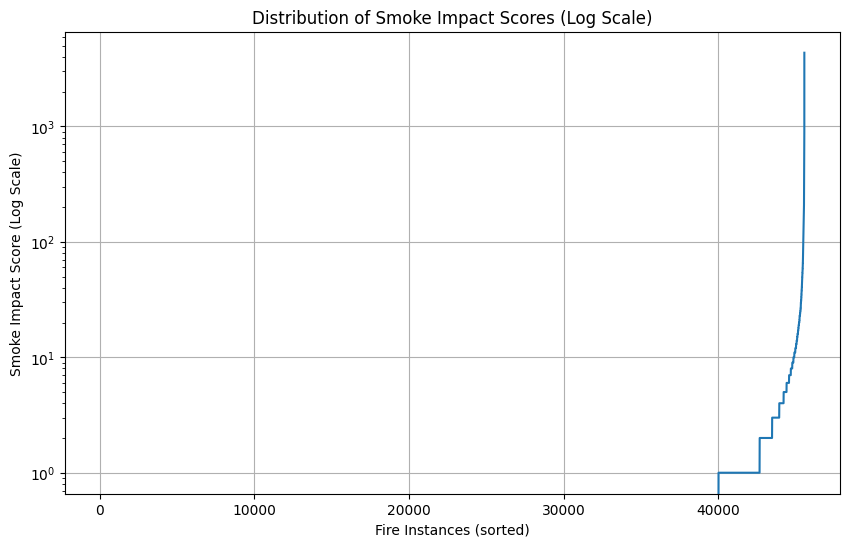

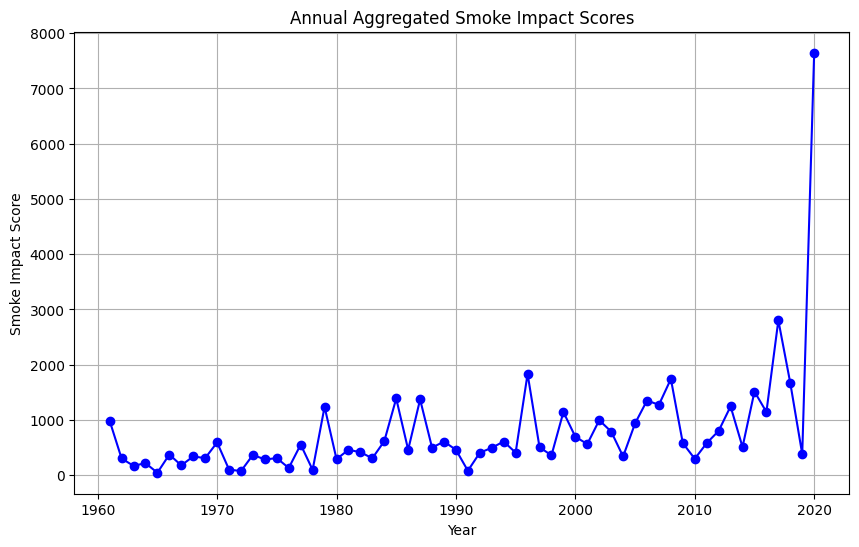

In [100]:
def summarize_smoke_impact_scores_from_file(file_path):
    # Load data from the JSON file
    with open(file_path, 'r') as f:
        relevant_fires = json.load(f)
    
    # Extract Smoke_Impact_Score values
    scores = [fire.get('Smoke_Impact_Score', 0) for fire in relevant_fires if 'Smoke_Impact_Score' in fire]
    
    # Create a DataFrame for the scores
    df = pd.DataFrame(scores, columns=['Smoke_Impact_Score'])
    
    # Calculate descriptive statistics and round to nearest whole number
    stats = df['Smoke_Impact_Score'].describe(percentiles=[0.25, 0.5, 0.75]).to_frame()
    stats.loc['min'] = round(df['Smoke_Impact_Score'].min())
    stats.loc['25%'] = round(df['Smoke_Impact_Score'].quantile(0.25))
    stats.loc['50%'] = round(df['Smoke_Impact_Score'].median())
    stats.loc['75%'] = round(df['Smoke_Impact_Score'].quantile(0.75))
    stats.loc['max'] = round(df['Smoke_Impact_Score'].max())

    # Convert count and mean to integers
    stats.loc['count'] = int(stats.loc['count'])
    stats.loc['mean'] = round(stats.loc['mean'])  # Round the mean to nearest whole number
    stats.loc['std'] = round(stats.loc['std'])  # Round the standard deviation to nearest whole number

    # Display descriptive statistics table
    print("Descriptive Statistics for Smoke Impact Scores:")
    print(stats)

    # Plot distribution of Smoke Impact Scores with log scale
    plt.figure(figsize=(10, 6))
    df['Smoke_Impact_Score'].sort_values().reset_index(drop=True).plot(kind='line')
    plt.yscale('log')  # Set y-axis to log scale
    plt.title("Distribution of Smoke Impact Scores (Log Scale)")
    plt.xlabel("Fire Instances (sorted)")
    plt.ylabel("Smoke Impact Score (Log Scale)")
    plt.grid(True)
    plt.show()


def plot_smoke_impact_timeseries(input_file):
    # Load the aggregated smoke impact data
    with open(input_file, 'r') as f:
        smoke_by_year = json.load(f)
    
    # Sort the data by year
    years = sorted(map(int, smoke_by_year.keys()))
    smoke_scores = [smoke_by_year[str(year)] for year in years]
    
    # Plot the data
    plt.figure(figsize=(10, 6))
    plt.plot(years, smoke_scores, marker='o', color='b', linestyle='-')
    plt.title("Annual Aggregated Smoke Impact Scores")
    plt.xlabel("Year")
    plt.ylabel("Smoke Impact Score")
    plt.grid(True)

summarize_smoke_impact_scores_from_file('relevant_fires_with_scores.json')
plot_smoke_impact_timeseries('smoke_by_year.json')


## How Close is the Smoke Estimate to Average AQI data from San Joaquin County? 

This code loads AQI and smoke data from 'yearly_average_aqi.json' and 'smoke_by_year.json' and computes both Pearson and Kendall Tau correlation coefficients for gaseous and particulate pollutants. 

The results are summarized for each pollutant type below.

In [101]:
def calculate_correlations(aqi_file, smoke_file):
    # Load the AQI and smoke data from JSON files
    with open(aqi_file, 'r') as f:
        aqi_data = json.load(f)

    with open(smoke_file, 'r') as f:
        smoke_data = json.load(f)

    # Prepare lists to hold AQI and smoke values for correlation analysis
    gaseous_aqi_values = []
    particulate_aqi_values = []
    smoke_values = []

    # Get years for gaseous and particulate pollutants
    years = sorted(set(aqi_data["gaseous_pollutants"].keys()).union(aqi_data["particulate_pollutants"].keys()).union(smoke_data.keys()))

    for year in years:
        gaseous_aqi = aqi_data["gaseous_pollutants"].get(year)
        particulate_aqi = aqi_data["particulate_pollutants"].get(year)
        smoke_value = smoke_data.get(year)

        if gaseous_aqi is not None and smoke_value is not None:
            gaseous_aqi_values.append(gaseous_aqi)
            smoke_values.append(smoke_value)

        if particulate_aqi is not None and smoke_value is not None:
            particulate_aqi_values.append(particulate_aqi)
            smoke_values.append(smoke_value)

    # Calculate correlations for gaseous pollutants
    if len(gaseous_aqi_values) > 1 and len(smoke_values) > 1:
        pearson_gaseous = pearsonr(gaseous_aqi_values, smoke_values[:len(gaseous_aqi_values)])[0]
        kendall_gaseous = kendalltau(gaseous_aqi_values, smoke_values[:len(gaseous_aqi_values)])[0]
    else:
        pearson_gaseous, kendall_gaseous = None, None

    # Calculate correlations for particulate pollutants
    if len(particulate_aqi_values) > 1 and len(smoke_values) > 1:
        pearson_particulate = pearsonr(particulate_aqi_values, smoke_values[-len(particulate_aqi_values):])[0]
        kendall_particulate = kendalltau(particulate_aqi_values, smoke_values[-len(particulate_aqi_values):])[0]
    else:
        pearson_particulate, kendall_particulate = None, None

    # Create a DataFrame to hold the results
    results_df = pd.DataFrame({
        'Pollutant Type': ['Gaseous', 'Particulate'],
        'Pearson Correlation': [pearson_gaseous, pearson_particulate],
        'Kendall Tau': [kendall_gaseous, kendall_particulate],
    })

    # Display the results in a table format
    print(results_df)

# Example usage:
aqi_file = 'yearly_average_aqi.json'  
smoke_file = 'smoke_by_year.json'      

calculate_correlations(aqi_file, smoke_file)


  Pollutant Type  Pearson Correlation  Kendall Tau
0        Gaseous             0.314765     0.232323
1    Particulate             0.263483     0.035218


# Visualizations

## Wildfires by Distance from Fresno

This code analyzes the distribution of wildfires based on their distance from Fresno, CA. 

The script counts the number of wildfires within specified distance increments (50 miles) up to a maximum of 1800 miles. 

The cutoff distance of 650 miles is shown with a dashed red line.


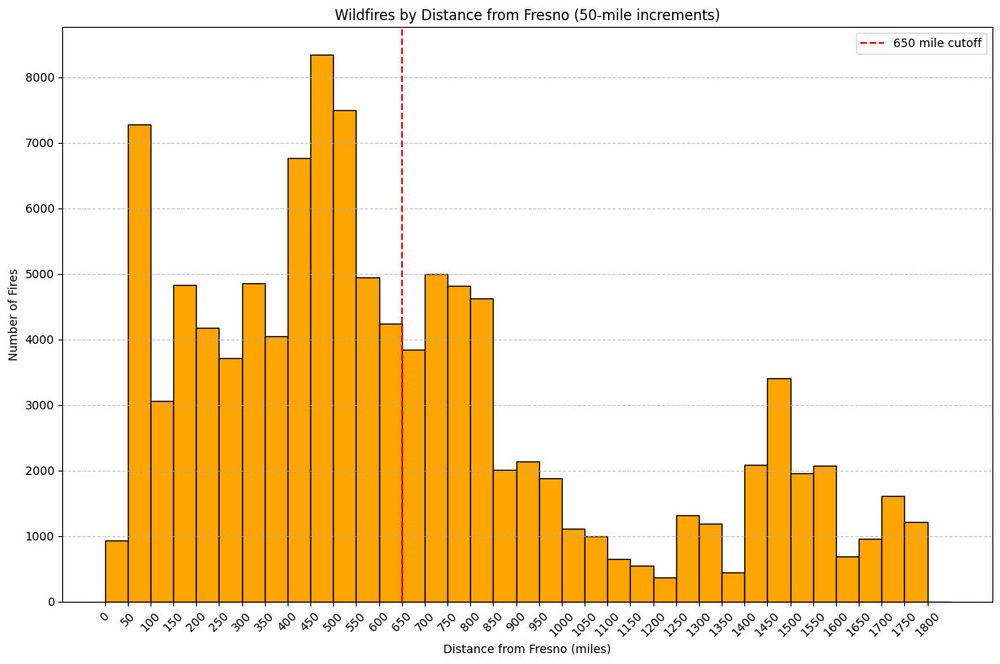

In [102]:
# Constants
fresno_location = [36.7477, -119.7723]
distance_increment = 50
max_distance = 1800
cutoff_distance = 650

# Load the processed fire data
with open('processed_fire_data.json', 'r') as file:
    fire_data = json.load(file)

# Count fires in 50-mile increments up to 1800 miles
distance_bins = np.arange(0, max_distance + distance_increment, distance_increment)
fire_counts = np.zeros_like(distance_bins)

for fire in fire_data:
    distance = fire['Closest_Distance_Miles']
    if distance <= max_distance:
        bin_index = int(distance // distance_increment)
        fire_counts[bin_index] += 1

# Plot histogram
plt.figure(figsize=(12, 8))
plt.bar(distance_bins, fire_counts, width=distance_increment, align='edge', color='orange', edgecolor='black')
plt.axvline(cutoff_distance, color='red', linestyle='--', label=f'650 mile cutoff')
plt.title("Wildfires by Distance from Fresno (50-mile increments)")
plt.xlabel("Distance from Fresno (miles)")
plt.ylabel("Number of Fires")
plt.xticks(distance_bins, rotation=45)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


## Total Acres Burned Per Year

This code visualizes the total acres burned by wildfires each year from 1961 to 2020 for fires located within 1800 miles of Fresno, CA. 

A time series line graph is then generated to illustrate the trend in total acres burned over the years. 

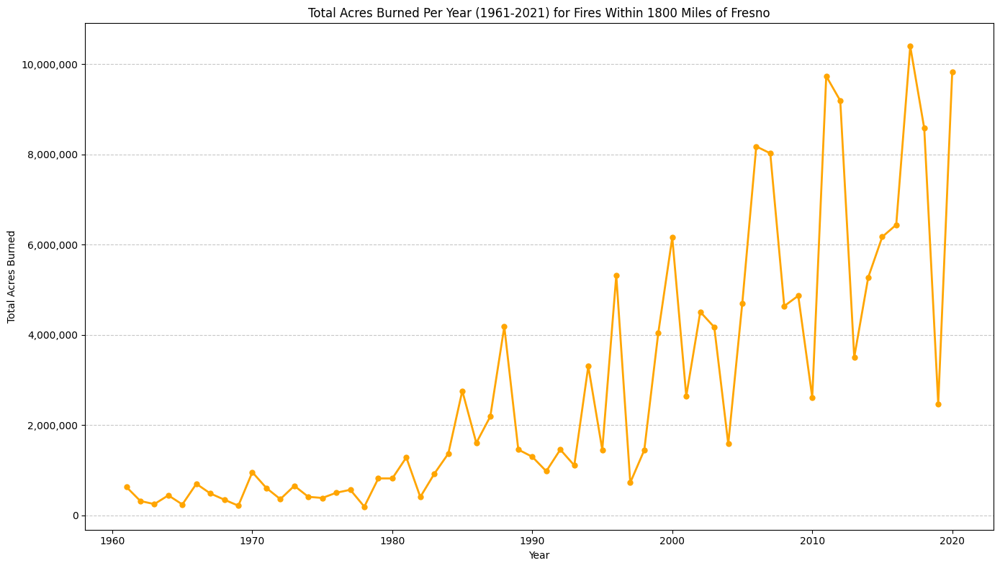

In [103]:
# Constants
start_year, end_year = 1961, 2020
max_distance = 1800  # Only consider fires within 1800 miles

# Load the processed fire data
with open('processed_fire_data.json', 'r') as file:
    fire_data = json.load(file)

# Aggregate total acres burned by year
total_acres_per_year = defaultdict(float)

for fire in fire_data:
    fire_year = fire['Fire_Year']
    distance = fire['Closest_Distance_Miles']
    acres_burned = fire['GIS_Acres']

    # Only consider fires within the 1961-2021 range and up to the max distance
    if start_year <= fire_year <= end_year and distance <= max_distance:
        total_acres_per_year[fire_year] += acres_burned

# Prepare data for plotting
years = list(range(start_year, end_year + 1))
acres_burned = [total_acres_per_year[year] for year in years]

# Plot time series of total acres burned per year
plt.figure(figsize=(14, 8))
plt.plot(years, acres_burned, marker='o', color='orange', linestyle='-', linewidth=2, markersize=5)
plt.title("Total Acres Burned Per Year (1961-2021) for Fires Within 1800 Miles of Fresno")
plt.xlabel("Year")
plt.ylabel("Total Acres Burned")
plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))  # Format y-axis with commas
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


## Time Series Plot of Fire Smoke Estimates vs. Gaseous and Particulate Pollutants (1961-2021)

This code block generates a time series plot that compares estimated smoke estimates with the annual averages of gaseous and particulate pollutants from 1961 to 2021. 

Fire smoke values are scaled by dividing them by 50 to enhance visualization, while pollutant values are extracted directly.

The line graph timeseries contains:
- **Fire Smoke Estimates** in orange.
- **Gaseous Pollutants** in blue, represented with a dashed line.
- **Particulate Pollutants** in green, depi


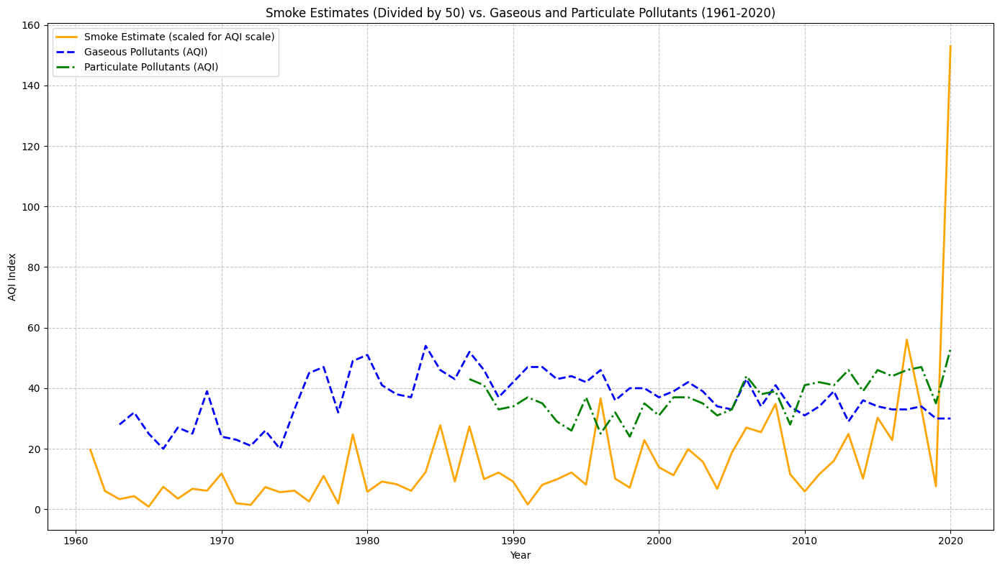

In [104]:
# Sample data (substitute with actual data)
gaseous_pollutants_yearly_avg = yearly_average_aqi_dict['gaseous_pollutants']
particulate_pollutants_yearly_avg = yearly_average_aqi_dict['particulate_pollutants']

# Years for plotting
years = sorted(set(smoke_by_year_dict.keys()).union(
    gaseous_pollutants_yearly_avg.keys(), particulate_pollutants_yearly_avg.keys()))
years = list(map(int, years))
years = years[:len(years)-1]

# Data for plotting, aligning by year
# Scale fire smoke values by dividing by 50
fire_smoke_values = [smoke_by_year_dict.get(str(year), 0) / 50 for year in years]
gaseous_values = [gaseous_pollutants_yearly_avg.get(str(year), None) for year in years]
particulate_values = [particulate_pollutants_yearly_avg.get(str(year), None) for year in years]

# Plotting the time series
plt.figure(figsize=(14, 8))
plt.plot(years, fire_smoke_values, label='Smoke Estimate (scaled for AQI scale)', color='orange', linewidth=2)
plt.plot(years, gaseous_values, label='Gaseous Pollutants (AQI)', color='blue', linestyle='--', linewidth=2)
plt.plot(years, particulate_values, label='Particulate Pollutants (AQI)', color='green', linestyle='-.', linewidth=2)

# Formatting the plot
plt.title("Smoke Estimates (Divided by 50) vs. Gaseous and Particulate Pollutants (1961-2020)")
plt.xlabel("Year")
plt.ylabel("AQI Index")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))  # Format y-axis with commas
plt.tight_layout()
plt.show()


## Forecasting Smoke Impact Scores using Exponential Smoothing

This code block implements the Holt-Winters Exponential Smoothing method to forecast smoke impact scores from 2025 to 2050 based on historical data from 1961 to 2021. The model captures both trend and seasonality in the data, providing a robust approach to time series forecasting.

The **Exponential Smoothing** method is chosen for this analysis due to its effectiveness in handling time series data with trends and seasonal patterns. According to [Machine Learning Mastery](https://machinelearningmastery.com/time-series-forecasting-methods-in-python-cheat-sheet/), exponential smoothing is useful for forecasting as it gives more weight to recent observations while accounting for historical trends.

The model forecasts smoke impact scores for the years 2025 to 2050, generating predictions that are appended to the historical data for comprehensive visualization.

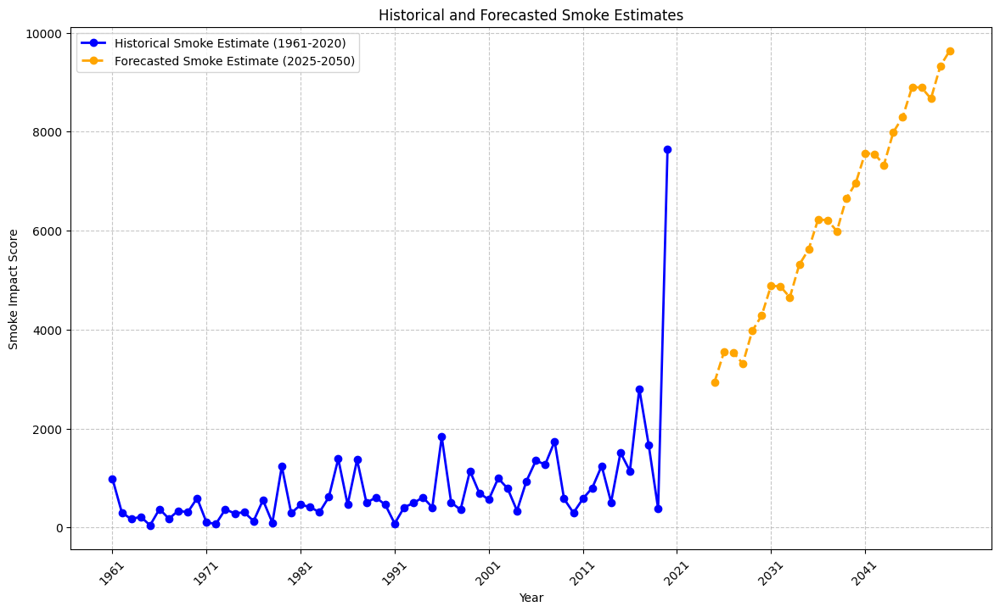

Forecasted Smoke Impact Scores (2025-2050):


,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
Year,2025,2026,2027,2028,2029,2030,2031,2032,2033,2034,...,2041,2042,2043,2044,2045,2046,2047,2048,2049,2050
Forecasted Smoke Impact Score,2942.47,3546.67,3534.16,3311.72,3971.62,4281.79,4885.99,4873.49,4651.05,5310.95,...,7564.64,7552.13,7329.69,7989.59,8299.76,8903.96,8891.46,8669.02,9328.91,9639.08


In [105]:
# Sample historical data (replace this with your actual data)
historical_years = list(range(1961, 2021))  # Adjust according to your actual data
# Simulating some historical smoke scores with variability for demonstration
historical_smoke_scores = list(smoke_by_year_dict.values())

# Fit Holt-Winters Seasonal model
model = ExponentialSmoothing(historical_smoke_scores, trend='add', seasonal='add', seasonal_periods=5)  # Adjust seasonal_periods based on your data
model_fit = model.fit(optimized=True)

# Forecasting for 2025 to 2050
future_years = list(range(2025, 2051))  # Forecasting from 2025 to 2050
forecast = model_fit.forecast(len(future_years))

# Combine historical and forecasted data for plotting
all_scores = historical_smoke_scores + list(forecast)
xticks_years = list(range(1961, 2051, 10))  # Show every 10 years from 1961 to 2050

# Plotting the historical and forecasted values
plt.figure(figsize=(14, 8))
plt.plot(historical_years, historical_smoke_scores, label="Historical Smoke Estimate (1961-2020)", color="blue", marker='o', linewidth=2)
plt.plot(future_years, forecast, label="Forecasted Smoke Estimate (2025-2050)", color="orange", linestyle="--", marker='o', linewidth=2)

plt.title("Historical and Forecasted Smoke Estimates")
plt.xlabel("Year")
plt.ylabel("Smoke Impact Score")
plt.xticks(xticks_years, rotation=45)  # Set x-ticks to show all years
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# Print forecasted values
print("Forecasted Smoke Impact Scores (2025-2050):")

# Create a DataFrame for forecasted scores
forecast_df = pd.DataFrame({
    'Year': future_years,
    'Forecasted Smoke Impact Score': [f"{score:.2f}" for score in forecast]  # Format scores to two decimal places
})

forecast_df_transposed = forecast_df.T
forecast_df_transposed
